In [1]:
import numpy as np

In [3]:
from sklearn.datasets import make_classification

In [7]:
x, y = make_classification(n_samples = 100, n_features = 2, n_informative = 1, n_redundant = 0, n_classes = 2, n_clusters_per_class = 1, random_state = 41, hypercube = False, class_sep = 10)

In [9]:
import matplotlib.pyplot as plt

In [17]:
np.insert(x, 0, 1, axis =1)

array([[ 1.        ,  0.19924745, -0.11697552],
       [ 1.        , -0.24882029, -0.73115232],
       [ 1.        , -0.3544904 , -0.7081059 ],
       [ 1.        , -1.59086506, -2.01199214],
       [ 1.        , -0.20083951,  1.63493163],
       [ 1.        , -0.83241122,  0.15599044],
       [ 1.        , -1.79207014,  1.07782053],
       [ 1.        ,  0.0856607 ,  0.80626713],
       [ 1.        , -0.55865299,  0.74859527],
       [ 1.        , -1.95974262,  0.75152794],
       [ 1.        , -1.77828947, -0.90114581],
       [ 1.        , -1.77985853, -0.1815243 ],
       [ 1.        , -0.02194151, -2.98092432],
       [ 1.        ,  0.80563431,  1.20500136],
       [ 1.        , -1.82701214,  0.78302407],
       [ 1.        ,  0.38730728,  0.42968688],
       [ 1.        , -0.14108668, -0.73229726],
       [ 1.        , -1.87955941, -0.83930476],
       [ 1.        , -0.18232911,  0.83727062],
       [ 1.        , -1.77059533, -0.10255323],
       [ 1.        , -2.27658028,  0.658

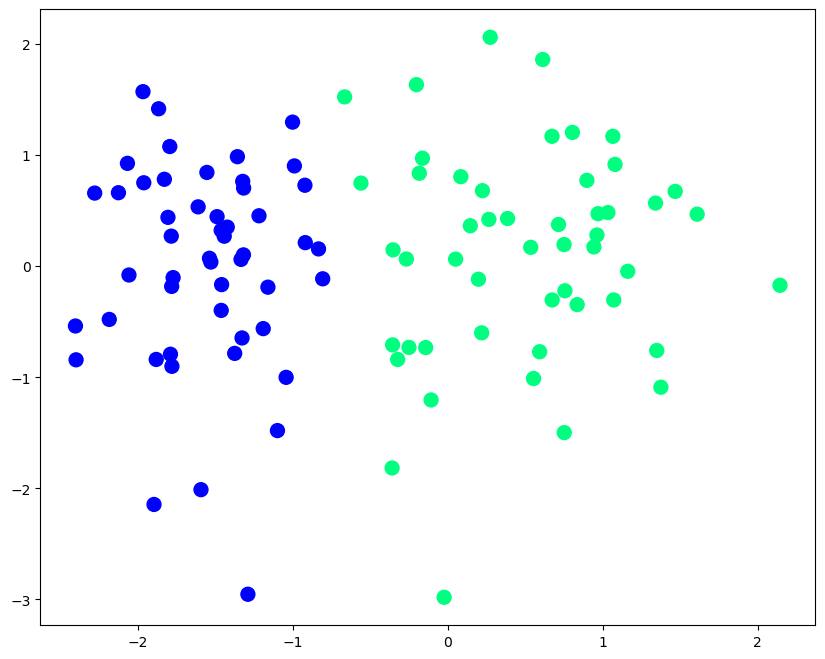

In [13]:
plt.figure(figsize = (10, 8))
plt.scatter(x[:,0], x[:,1], c =y, cmap = "winter", s = 100)

In [43]:
def perceptron(x,y):
    x = np.insert(x, 0, 1, axis = 1)
    weights = np.ones(x.shape[1])
    lr = 0.1

    for i in range(1000):
        j = np.random.randint(0, len(x))
        y_hat = step(np.dot(x[j], weights))
        weights = weights + lr * (y[j]-y_hat)*x[j]

    return weights[0],weights[1:]

In [53]:
#sample to verify
np.dot(np.insert(x[40],0,1),[1,1,1])

-0.9717594729493686

In [45]:
def step(z):
    return 1 if z>0 else 0


In [55]:
step(-0.97)

0

In [49]:
intercept_,coef_ = perceptron(x,y)

In [59]:
print(coef_)
print(intercept_)

[1.31179934 0.18155069]
0.9


In [61]:
#for slope of line of y = mx + b
m = -(coef_[0]/coef_[1])
b = -(intercept_/coef_[1])

In [63]:
x_input = np.linspace(-3,3, 100)
y_input = m*x_input + b

(-3.0, 2.0)

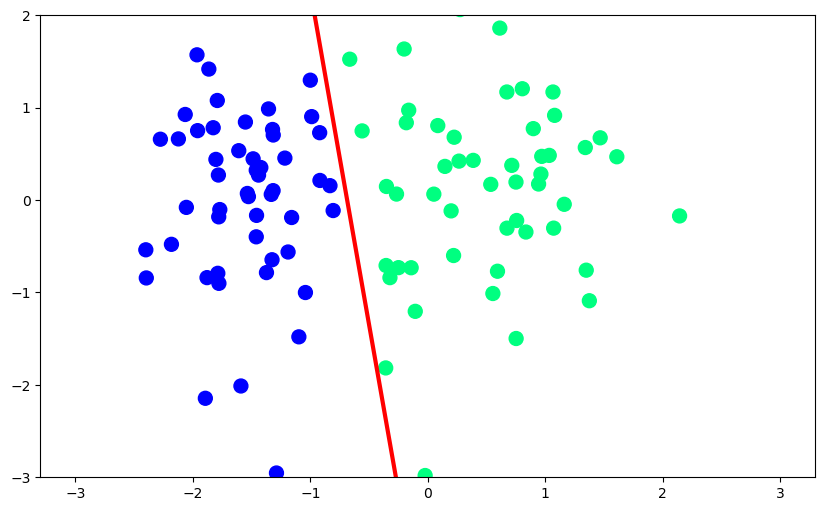

In [71]:
plt.figure(figsize =(10,6))
plt.plot(x_input,y_input, color = 'red', linewidth = 3)
plt.scatter(x[:,0],x[:,1],c=y,cmap = 'winter',s=100)
plt.ylim(-3,2)

In [73]:
def perceptron(x,y):
    m =[]
    b=[]

    x = np.insert(x, 0, 1, axis =1)
    weights = np.ones(x.shape[1])
    lr = 0.1

    for i  in range(200):
        j = np.random.randint(0,100)
        y_hat = step(np.dot(x[j],weights))

        weights = weights + lr *(y[j] - y_hat)*x[j]

        m.append(-(weights[1]/weights[2]))
        b.append(-(weights[0]/weights[2]))
    return m,b

In [75]:
m,b = perceptron(x,y)

In [96]:
%matplotlib inline

from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation

In [102]:
%matplotlib inline

fig, ax = plt.subplots(figsize =(9,5))
xi = np.arange(-3,3, 0.1)
yi =xi * m[0] + b[0]

ax.scatter(x[:,0],x[:,1],c=y, cmap='winter',s =100)
line, = ax.plot(xi,xi*m[0] + b[0],'r-',linewidth = 2)
plt.ylim(-3,3)
def update(i):
    label = 'epoch {0}'.format(i+1)
    line.set_ydata(xi*m[i] + b[i])
    ax.set_xlabel(label)

anim = FuncAnimation(fig, update, repeat = True, frames = 200, interval = 100)
from IPython.display import HTML
HTML(anim.to_jshtml())
